Geospatial Analysis


In [9]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
dataset = pd.read_csv("Dataset.csv")
dataset.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


Visualize the locations of restaurants on a map using latitude and longitude information.


In [31]:
!pip install folium

In [36]:
import folium
from IPython.display import display

# Extract the required columns for visualization
latitude = dataset['Latitude']
longitude = dataset['Longitude']
restaurant_names = dataset['Restaurant Name']

# Create a map centered around the average latitude and longitude of the dataset
map_center = [latitude.mean(), longitude.mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

# Add restaurant locations to the map
for lat, lon, name in zip(latitude, longitude, restaurant_names):
    folium.Marker(location=[lat, lon],popup=name,icon=folium.Icon(color="blue", icon="info-sign")).add_to(restaurant_map)

# Display the map in the notebook
display(restaurant_map)

Analyze the distribution of restaurants across different cities or countries. Determine if there is any correlation between the restaurant's location and its rating.

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_21812\3142267207.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=dataset["City"],order=dataset.City.value_counts().head(10).index,palette='Set2')


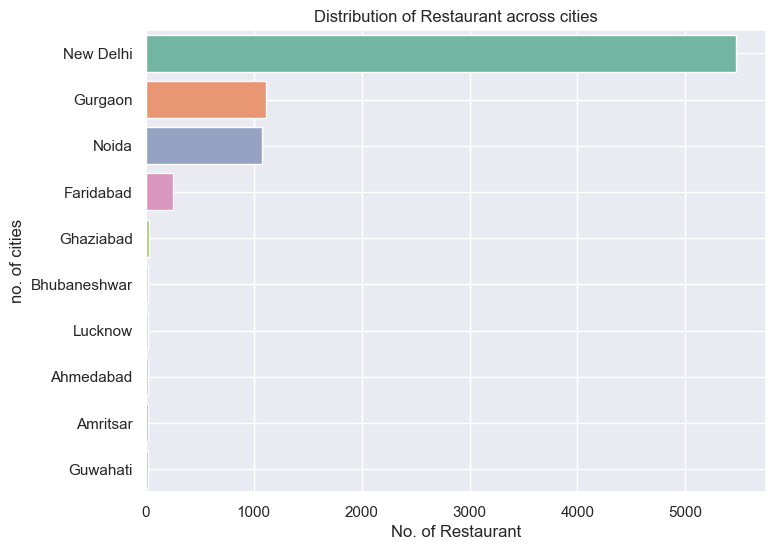

In [28]:
import seaborn as sns;sns.set(color_codes=True)
plt.figure(figsize=(8, 6))
sns.countplot(y=dataset["City"],order=dataset.City.value_counts().head(10).index,palette='Set2')
plt.title('Distribution of Restaurant across cities')
plt.ylabel('no. of cities')
plt.xlabel('No. of Restaurant')
plt.grid(True)
plt.show()

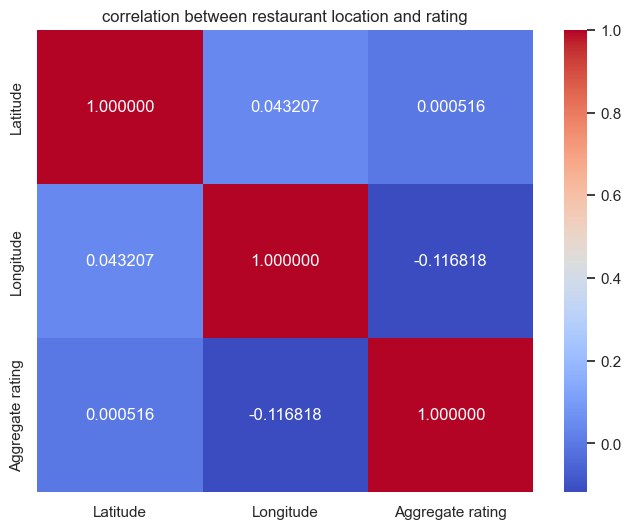

In [29]:
plt.figure(figsize=(8, 6))
correlation_matrix=dataset[["Latitude","Longitude","Aggregate rating"]].corr()
sns.heatmap(correlation_matrix,annot=True,cmap='coolwarm',fmt="2f")
plt.title('correlation between restaurant location and rating')
plt.show()